In [17]:
import numpy as np
import pandas as pd
import re
import matplotlib.pyplot as plt
import networkx as nx
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import _tree
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import AgglomerativeClustering
import plotly.express as px
from pulp import LpProblem, LpVariable, LpMaximize, lpSum, LpStatus, value
from sklearn.decomposition import PCA

import seaborn as sns
from sklearn.ensemble import RandomForestClassifier

from sklearn.preprocessing import LabelEncoder

In [29]:
df = pd.read_csv("sigRF/data/monkey_pox.csv")

In [30]:
print(df.columns)

Index(['Patient_ID', 'Systemic Illness', 'Rectal Pain', 'Sore Throat',
       'Penile Oedema', 'Oral Lesions', 'Solitary Lesion', 'Swollen Tonsils',
       'HIV Infection', 'Sexually Transmitted Infection', 'MonkeyPox'],
      dtype='object')


In [31]:
df.drop("Patient_ID", axis = 1, inplace = True)

In [13]:
df.dropna(inplace = True)

In [34]:
le_SystemicIllness = LabelEncoder()
le_RectalPain = LabelEncoder()
le_SoreThroat = LabelEncoder()
le_PenileOedema = LabelEncoder()
le_OralLesions = LabelEncoder()
le_SolitaryLesion = LabelEncoder()
le_SwollenTonsil = LabelEncoder()
le_HIVInfection = LabelEncoder()
le_SexuallyTransmittedInfection = LabelEncoder()
le_MonkeyPox = LabelEncoder()



In [35]:
df["HIV Infection"] = le_HIVInfection.fit_transform(df["HIV Infection"])
df["Systemic Illness"] = le_SystemicIllness.fit_transform(df["Systemic Illness"])
df["MonkeyPox"] = le_MonkeyPox.fit_transform(df["MonkeyPox"])
df["Oral Lesions"] = le_OralLesions.fit_transform(df["Oral Lesions"])
df["Penile Oedema"] = le_PenileOedema.fit_transform(df["Penile Oedema"])
df["Solitary Lesion"] = le_SolitaryLesion.fit_transform(df["Solitary Lesion"])
df["Rectal Pain"] = le_RectalPain.fit_transform(df["Rectal Pain"])
df["Sexually Transmitted Infection"] = le_SexuallyTransmittedInfection.fit_transform(df["Sexually Transmitted Infection"])
df["Swollen Tonsils"] = le_SwollenTonsil.fit_transform(df["Swollen Tonsils"])
df["Sore Throat"] = le_SoreThroat.fit_transform(df["Sore Throat"])

In [55]:
X = df.drop("MonkeyPox", axis = 1)
y = df[["MonkeyPox"]]

In [56]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.3, random_state =42)

In [57]:
rf = RandomForestClassifier(n_estimators=30, random_state=42)
rf.fit(X_train, y_train)

/Users/DubeyA-Dev/miniconda3/envs/taylor/lib/python3.10/site-packages/sklearn/base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier(n_estimators=30, random_state=42)

In [63]:
y_pred = rf.predict(X_test)

In [64]:
from sklearn.metrics import f1_score, confusion_matrix
print("F1 Score: ",f1_score(y_pred, y_test))


F1 Score:  0.7752128666035951


## Calculating feature usage in decision paths and feature importance based on impurity reduction

In [38]:
from sigRF.decision_path import get_decision_paths, extract_rule_paths, extract_tree_paths

In [65]:
decision_paths = get_decision_paths(rf, X_train)

In [66]:
decision_paths

[[([('Systemic Illness', 0.5, 'left'),
    ('Sexually Transmitted Infection', 0.5, 'left'),
    ('Rectal Pain', 0.5, 'left'),
    ('HIV Infection', 0.5, 'right'),
    ('Solitary Lesion', 0.5, 'right'),
    ('Penile Oedema', 0.5, 'right'),
    ('Oral Lesions', 0.5, 'right'),
    ('Sore Throat', 0.5, 'left'),
    ('Swollen Tonsils', 0.5, 'left')],
   1),
  ([('Systemic Illness', 0.5, 'right'),
    ('HIV Infection', 0.5, 'right'),
    ('Systemic Illness', 1.5, 'right'),
    ('Sexually Transmitted Infection', 0.5, 'left'),
    ('Penile Oedema', 0.5, 'left'),
    ('Rectal Pain', 0.5, 'left'),
    ('Oral Lesions', 0.5, 'left'),
    ('Sore Throat', 0.5, 'right'),
    ('Systemic Illness', 2.5, 'left'),
    ('Swollen Tonsils', 0.5, 'right'),
    ('Solitary Lesion', 0.5, 'left')],
   0),
  ([('Systemic Illness', 0.5, 'right'),
    ('HIV Infection', 0.5, 'left'),
    ('Rectal Pain', 0.5, 'left'),
    ('Sexually Transmitted Infection', 0.5, 'left'),
    ('Systemic Illness', 1.5, 'left'),
    ('Sor

In [67]:
feature_names = X.columns

In [68]:
all_rule_texts = []
for est in rf.estimators_:
    rules = extract_rule_paths(est, feature_names)
    all_rule_texts.extend(rules)
all_rule_texts[0]

'(Systemic Illness <= 0.50) AND (Sexually Transmitted Infection <= 0.50) AND (Rectal Pain <= 0.50) AND (HIV Infection <= 0.50) AND (Swollen Tonsils <= 0.50) AND (Solitary Lesion <= 0.50) AND (Sore Throat <= 0.50) AND (Penile Oedema <= 0.50) AND (Oral Lesions <= 0.50)'

In [69]:
from sigRF.encode_decode import encode_rule_structure
# Encode the rules
encoded_rules = encode_rule_structure(all_rule_texts, columns= X.columns)

# Show some of the encoded rules
for i in range(5):
    print(encoded_rules[i])


FEAT_8_LTE_0.50) AND FEAT_4_LTE_0.50) AND FEAT_3_LTE_0.50) AND FEAT_0_LTE_0.50) AND FEAT_7_LTE_0.50) AND FEAT_5_LTE_0.50) AND FEAT_6_LTE_0.50) AND FEAT_2_LTE_0.50) AND FEAT_1_LTE_0.50)
FEAT_8_LTE_0.50) AND FEAT_4_LTE_0.50) AND FEAT_3_LTE_0.50) AND FEAT_0_LTE_0.50) AND FEAT_7_LTE_0.50) AND FEAT_5_LTE_0.50) AND FEAT_6_LTE_0.50) AND FEAT_2_LTE_0.50) AND FEAT_1_GT_0.50)
FEAT_8_LTE_0.50) AND FEAT_4_LTE_0.50) AND FEAT_3_LTE_0.50) AND FEAT_0_LTE_0.50) AND FEAT_7_LTE_0.50) AND FEAT_5_LTE_0.50) AND FEAT_6_LTE_0.50) AND FEAT_2_GT_0.50) AND FEAT_1_LTE_0.50)
FEAT_8_LTE_0.50) AND FEAT_4_LTE_0.50) AND FEAT_3_LTE_0.50) AND FEAT_0_LTE_0.50) AND FEAT_7_LTE_0.50) AND FEAT_5_LTE_0.50) AND FEAT_6_LTE_0.50) AND FEAT_2_GT_0.50) AND FEAT_1_GT_0.50)
FEAT_8_LTE_0.50) AND FEAT_4_LTE_0.50) AND FEAT_3_LTE_0.50) AND FEAT_0_LTE_0.50) AND FEAT_7_LTE_0.50) AND FEAT_5_LTE_0.50) AND FEAT_6_GT_0.50) AND FEAT_1_LTE_0.50) AND FEAT_2_LTE_0.50)


In [70]:
# Function to decode an encoded rule
from sigRF.encode_decode import decode_rule_structure

# Example of decoding the encoded rules
encoded_rule_example = [encoded_rules[0]]  # Example encoded rule
decoded_rule = decode_rule_structure(encoded_rule_example, columns = X.columns)

# Show the decoded rule
print(decoded_rule[0])  # Example output: (mean radius <= 15.5) AND (mean smoothness > 20.1)


(Systemic Illness <= 0.50)) AND (Sexually Transmitted Infection <= 0.50)) AND (Rectal Pain <= 0.50)) AND (HIV Infection <= 0.50)) AND (Swollen Tonsils <= 0.50)) AND (Solitary Lesion <= 0.50)) AND (Sore Throat <= 0.50)) AND (Penile Oedema <= 0.50)) AND (Oral Lesions <= 0.50))


In [71]:
# from sigRF.SIG import create_sig
# ##User can directly create optimized SIG
# sig = create_sig(columns=X.columns, encoded_rules=encoded_rules)

In [ ]:
from sigRF.SIG import create_sig_optimized
sig_optimized  = create_sig_optimized(columns=X.columns, encoded_rules=encoded_rules, max_edges=10)

In [95]:
sig_optimized.remove_edge('Sexually Transmitted Infection', 'Sexually Transmitted Infection')

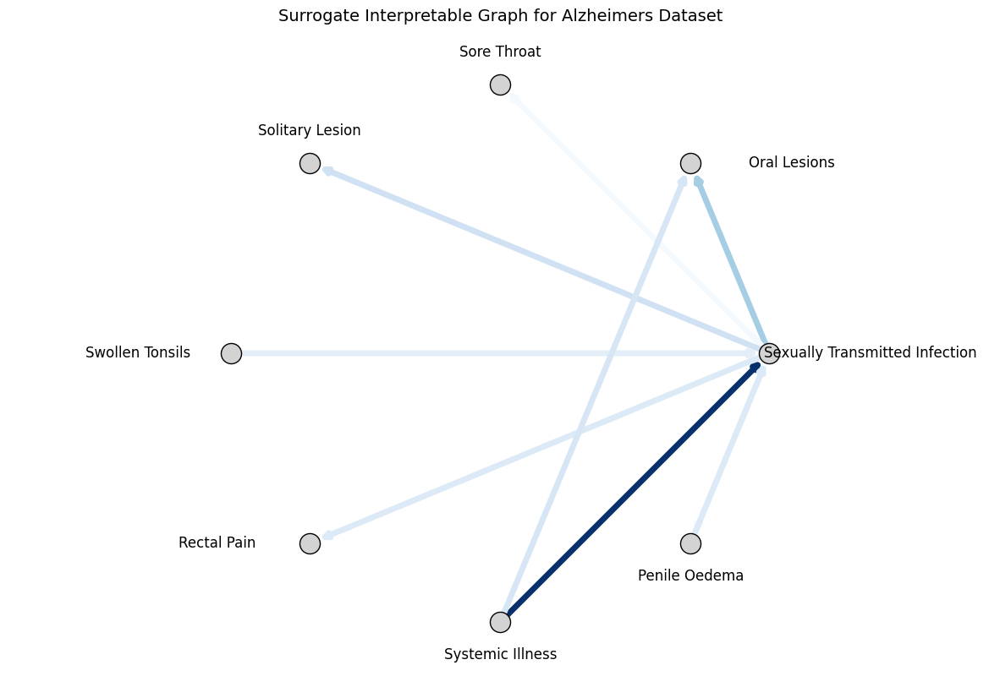

In [96]:
from sigRF.SIG import beautify
beautify(sig_optimized)

## Interpretation supporting domain validation
## Evaluation of Feature Chains for Monkeypox Diagnosis

Below is an expert analysis of how the provided feature chains relate to monkeypox, based on the search results:

---

### 1. Swollen Tonsils → STI → Oral Lesions

- **Support:** Monkeypox can present with oropharyngeal symptoms, including swollen tonsils and oral lesions, especially in patients with a history of receptive oral sex, which is a recognized STI risk factor in recent outbreaks[5]. Tonsillar and oral lesions are documented, often in the context of sexual transmission[5].
- **Validation:** This chain is well-supported; monkeypox may present with tonsillar swelling and oral lesions, particularly in those with STI risk factors[5].

---

### 2. Swollen Tonsils → STI → Penile Oedema

- **Support:** While swollen tonsils and penile oedema are both recognized manifestations of monkeypox, direct co-occurrence is less documented. Both can occur in patients with STI risk factors, but there is no strong evidence that swollen tonsils specifically predict penile oedema[3][5].
- **Validation:** Possible but less directly supported; both features can be present in monkeypox, especially in high-risk sexual networks, but their direct linkage is not established.

---

### 3. Swollen Tonsils → STI → Solitary Lesion

- **Support:** Solitary lesions (including in the mouth or genital area) are increasingly recognized in monkeypox cases, sometimes in patients with oropharyngeal symptoms and STI risk factors[3][5]. However, swollen tonsils do not specifically predict solitary lesions.
- **Validation:** This chain is plausible in the context of monkeypox, but the association is indirect.

---

### 4. Swollen Tonsils → STI → Sore Throat

- **Support:** Swollen tonsils and sore throat are both oropharyngeal symptoms seen in monkeypox, especially among those with STI risk factors[1][2][5]. Sore throat is a common presentation, and tonsillar involvement may cause or accompany it[1][2][5].
- **Validation:** Well-supported; both features can co-occur, particularly in the context of sexual transmission.

---

### 5. Systemic Illness → STI → Oral Lesions

- **Support:** Systemic symptoms (fever, malaise) often precede or accompany mucosal/oral lesions in monkeypox, especially in individuals with STI risk factors[3][5][6]. Oral lesions are a recognized manifestation.
- **Validation:** Strongly supported; this is a typical presentation sequence.

---

### 6. Systemic Illness → STI → Penile Oedema

- **Support:** Systemic illness and penile oedema can both occur in monkeypox, particularly in patients with STI risk factors and sexual exposure[3]. Penile oedema is increasingly recognized in recent outbreaks.
- **Validation:** Supported; both features are documented in monkeypox, especially in at-risk populations.

---

### 7. Systemic Illness → STI → Solitary Lesion

- **Support:** Systemic symptoms followed by a solitary lesion (oral, genital, or skin) are well-documented in monkeypox, especially in individuals with STI risk factors[3][5][6].
- **Validation:** Strongly supported.

---

### 8. Systemic Illness → STI → Sore Throat

- **Support:** Systemic illness followed by sore throat is a common presentation in monkeypox, particularly in the context of sexual transmission[1][2][3][5].
- **Validation:** Strongly supported.

---

### 9. Swollen Tonsils → STI → Rectal Pain

- **Support:** Both swollen tonsils and rectal pain are recognized features of monkeypox, especially in those with STI risk factors[3][5][7]. However, there is no direct clinical linkage between swollen tonsils and rectal pain.
- **Validation:** Both can be present in the same patient, but their direct association is not established.

---

### 10. Systemic Illness → STI → Rectal Pain

- **Support:** Systemic symptoms and rectal pain are both well-documented in monkeypox, particularly among those with STI risk factors and sexual exposure[3][7].
- **Validation:** Strongly supported.

---

## Summary Table

| Feature Chain                          | Support for Monkeypox Diagnosis           |
|----------------------------------------|-------------------------------------------|
| Swollen Tonsils → STI → Oral Lesions   | Strongly supported                        |
| Swollen Tonsils → STI → Penile Oedema  | Possible, less directly supported         |
| Swollen Tonsils → STI → Solitary Lesion| Plausible, indirect association           |
| Swollen Tonsils → STI → Sore Throat    | Strongly supported                        |
| Systemic Illness → STI → Oral Lesions  | Strongly supported                        |
| Systemic Illness → STI → Penile Oedema | Supported                                 |
| Systemic Illness → STI → Solitary Lesion| Strongly supported                       |
| Systemic Illness → STI → Sore Throat   | Strongly supported                        |
| Swollen Tonsils → STI → Rectal Pain    | Possible, not directly linked             |
| Systemic Illness → STI → Rectal Pain   | Strongly supported                        |

## Expert Conclusion

Chains involving systemic illness or oropharyngeal symptoms (swollen tonsils, sore throat) progressing to mucosal or genital lesions, especially in the context of STI risk factors, are well-supported diagnostic patterns for monkeypox[3][5][7]. Direct linkage between oropharyngeal and genital/rectal features is less established, but their co-occurrence in at-risk populations is recognized.

Citations:
[1] https://journals.sagepub.com/doi/full/10.1177/01455613241260769
[2] https://pmc.ncbi.nlm.nih.gov/articles/PMC9943563/
[3] https://www.who.int/news-room/fact-sheets/detail/mpox
[4] https://www.cdc.gov/mpox/signs-symptoms/index.html
[5] https://pmc.ncbi.nlm.nih.gov/articles/PMC9534084/
[6] https://en.wikipedia.org/wiki/Mpox
[7] https://www.healthdirect.gov.au/monkeypox
[8] https://www.sciencedirect.com/science/article/abs/pii/S0736467922008101

---
Answer from Perplexity: pplx.ai/share